## EEG Visualization - Final Implementation
#### Set up Environment 

In [2]:
# import data 
import mne 
import matplotlib
import scipy as sp 
import numpy as np 
import pandas as pd 
import altair as alt 
import sklearn as sk 
import matplotlib.pyplot as plt

from scipy.io import loadmat
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA

#### Data Import 

First, let's read in the data. The data, which is nested within several lists, was separated into microvolt (averaged, to reduce size) and time data. 

In [3]:
data = loadmat('eeg.mat')

# pull data, EEG units are microvolts (uV)
eeg_uV = data["EEG"][0,0]["data"].mean(axis=2) # averaged EEG
time_ms = data["EEG"][0,0]["times"][0] # time data 

# append column names into list 
columns = [] 
for i in range(64): 
    columns.append(data['EEG'][0]['chanlocs'][0][0,i][0][0])

In [4]:
# check data type 
type(eeg_uV)

numpy.ndarray

#### View Channel Activity 

Python's MNE package can be used to determine if there are any 'bad' channels within the dataset, which will determine the preprocessing steps. The package will analyze and visualize the EEG data. First, an information object that behaves like a dictionary needs to be built. 

In [5]:
# specify 64 eeg channels 
ch_types = ['eeg'] * len(columns) 

# create info object
info = mne.create_info(columns, ch_types=ch_types, sfreq=640) 

# set channel order to 10-20 eeg cap 
info.set_montage('standard_1020') 

<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: False
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 0.0 Hz
 lowpass: 320.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 640.0 Hz
>

Now, let's create a RawArray object using the microvolt and column data. [Raw Array](https://mne.tools/stable/generated/mne.io.RawArray.html) objects are built from ndarrays like those in the .mat file, which are organized so they can be plotted and analyzed. 

Creating RawArray with float64 data, n_channels=64, n_times=640
    Range : 0 ... 639 =      0.000 ...     0.998 secs
Ready.
Using matplotlib as 2D backend.
Channels marked as bad: none


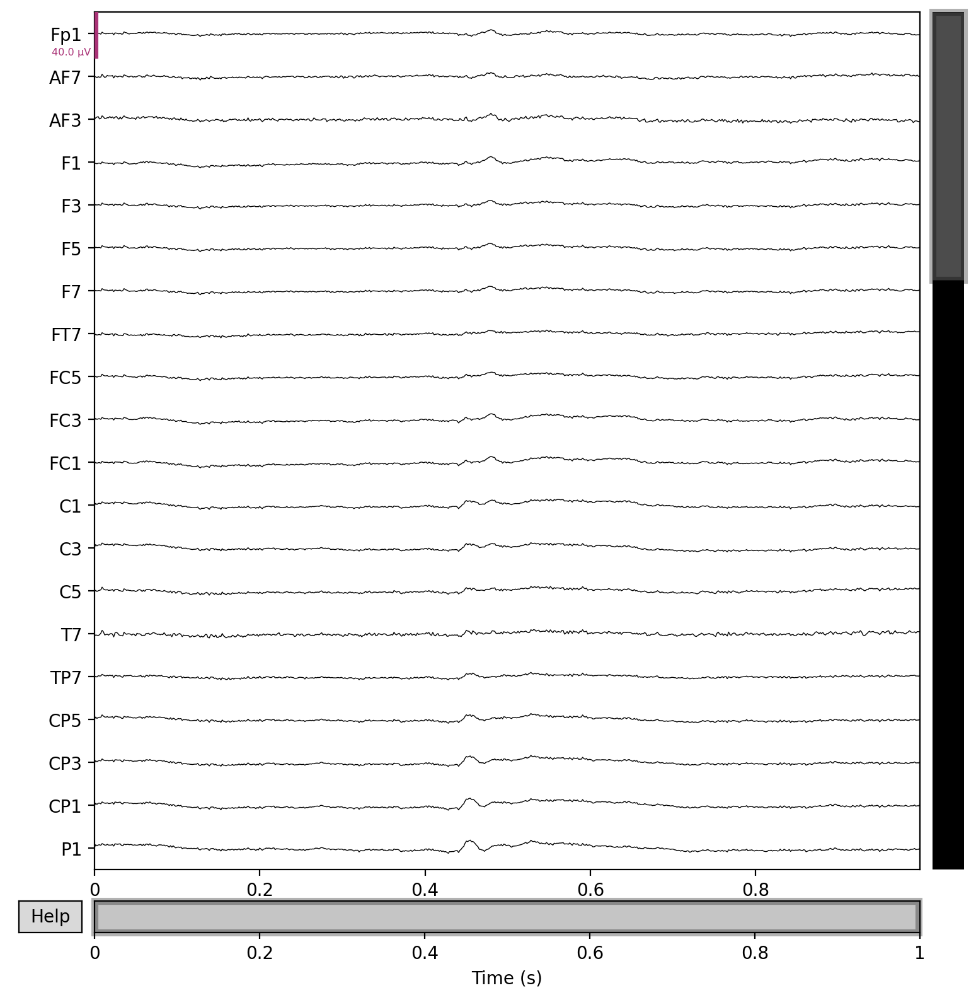

In [6]:
# create RawArray from data
raw = mne.io.RawArray(eeg_uV, info)
raw._data*=1e-6 # convert to volts (from microvolts) 

# display method; interactive in external window
%matplotlib qt 
mne.viz.plot_raw(raw, title='Channel Activity Over Time in Volts', block=True) # plot 

Within the dataset, none of the channels contain vastly different activity from each other. Additionally, the MNE package did not mark any as 'bad' channels either. Therefore, none of the channels were removed from the data. 

#### Principal Component Analysis (PCA)

The next step is to employ PCA as a dimensionality reduction measure to find the number of components that would account for 95% of the variance. Due to a large sampling, a dimension reductionality measure will be used.

In [7]:
# create PCA that describes 95% variance 
pca = PCA(0.95)

# fit and apply model on dataset 
pc = pca.fit_transform(eeg_uV) #fit and apply the model on the dataset

# transform data back to its original dimensionality
projected = pca.inverse_transform(pc).reshape(640,64)
n = pca.components_.shape[0] # number of components

#### Clustering 

Visualizing overall channel data gives us some trends in the data but presents too much data at a time. A single channel may give us relevant information but can get arduous with 64 channels. Therefore, viewing grouped channel activity gives greater insight to the researcher about what is going on the brain. 

To group channels with similar activity sklearn's [Gaussian Mixture Model](https://scikit-learn.org/stable/modules/generated/sklearn.mixture.GaussianMixture.html) was used. This mixture model was chosen because it is a lot more robust than the KMeans algorithm.

In [8]:
# create Gaussian Mixture Model 
gmm = GaussianMixture(n_components=n, init_params='kmeans')

# fit model and predict data 
gmm.fit(pc)
glabels = gmm.predict(pc)

#### Data Modeling

To visualize the data, a pandas dataframe needs to be created from the .mat file. 

In [9]:
# create dataframe; 640 rows with 65 columns (64 channels + time column)
eeg_uV = pd.DataFrame(projected, columns=columns)
eeg_uV['time_ms'] = time_ms
eeg_uV

,Fp1,AF7,AF3,F1,F3,F5,F7,FT7,FC5,FC3,...,CP2,P2,P4,P6,P8,P10,PO8,PO4,O2,time_ms
0,-0.900901,-0.096233,-0.422933,0.118097,-0.073472,-0.407212,1.550783,0.611836,-0.003301,-0.178541,...,-0.246103,-0.099619,-0.568423,-1.235155,-0.514184,-1.239139,-0.230568,-0.361890,-1.305479,-1000.00000
1,-1.138909,-0.427125,-0.762553,-0.085185,-1.078249,-0.690392,-1.110902,-1.020487,-1.589184,-1.445494,...,0.189756,-0.930683,-1.480539,-1.159000,-0.926734,-0.742888,-1.270485,-0.856788,-1.354577,-996.09375
2,-0.397507,-1.353801,-1.987730,-0.834390,-1.051565,-0.681256,-0.468870,-0.236998,-0.875130,-0.934080,...,-0.979670,-0.766035,-0.735876,-0.778787,-0.901371,-0.266276,-0.525444,-0.626243,-0.169630,-992.18750
3,-0.429630,-1.250140,-0.645347,-0.860920,-1.253150,-0.210080,-0.494743,-0.715423,-0.620855,-1.113515,...,0.239233,0.415093,0.105556,0.615852,-0.122234,0.640481,0.901721,0.638871,0.300345,-988.28125
4,0.780173,0.952489,0.072651,0.960300,0.402801,-0.106830,1.123608,-0.448546,-0.366810,-0.241064,...,-0.487736,-0.753119,-1.147658,-1.829547,-1.331496,-2.920112,-1.842714,-1.340065,-2.082723,-984.37500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
635,5.248698,5.457352,4.062164,3.141876,4.630278,5.000619,4.438073,3.933223,4.471283,5.423836,...,4.727480,4.203539,3.006793,5.652399,4.129173,3.150815,4.859264,4.669487,5.394549,1480.46875
636,4.136526,3.865337,3.155860,3.544054,4.356435,4.961617,4.122003,3.829108,4.630033,4.823329,...,4.778091,5.113394,3.862507,3.723027,4.572692,4.721825,4.595533,4.509031,4.719288,1484.37500
637,4.102319,3.885851,3.371524,3.576862,4.430937,3.708600,2.363450,2.705191,2.527791,1.686893,...,3.456373,3.299851,3.896084,1.725833,2.471102,2.454275,3.122819,2.229306,1.618113,1488.28125
638,3.579317,3.387899,2.852885,3.664050,2.481816,3.710851,2.330499,2.474247,1.536026,1.677090,...,1.246921,0.989706,2.102962,3.481700,2.900993,2.010973,4.314184,4.545098,3.733609,1492.18750


Unfortunately, the data is currently in wide-form. Altair only accepts long-form data so to convert it, pandas' [melt](https://altair-viz.github.io/user_guide/data.html#converting-between-long-form-and-wide-form-pandas) function can be used. The resulting dataframe contains a single entry for each channel for each time point (640 timepoints * 64 channels). Because of the data transformation, the dataframe now contains more than 5,000 and requires us to disable max rows in Altair to avoid errors. 

In [10]:
# convert wide-form to long-form 
source = eeg_uV.melt('time_ms')

# disable max rows
alt.data_transformers.disable_max_rows();

In [11]:
# create a list of channel clusters
cluster_grouped = []

# fill cluster list 
for i in range(len(np.unique(glabels))):
    coll = [columns[j] for j in np.where(glabels == i)[0]]
    cluster_grouped.append(coll)
    
# conditions and choices 
conditions = [
    (source['variable'].isin(cluster_grouped[0])),
    (source['variable'].isin(cluster_grouped[1])),
    (source['variable'].isin(cluster_grouped[2])),
    (source['variable'].isin(cluster_grouped[3])), 
    (source['variable'].isin(cluster_grouped[4])), 
    (source['variable'].isin(cluster_grouped[5]))
]

choices = [1, 2, 3, 4, 5, 6]

# apply conditions/cluster labels  
source['cluster'] = np.select(conditions, choices)
source

,time_ms,variable,value,cluster
0,-1000.00000,Fp1,-0.900901,4
1,-996.09375,Fp1,-1.138909,4
2,-992.18750,Fp1,-0.397507,4
3,-988.28125,Fp1,-0.429630,4
4,-984.37500,Fp1,0.780173,4
...,...,...,...,...
40955,1480.46875,O2,5.394549,5
40956,1484.37500,O2,4.719288,5
40957,1488.28125,O2,1.618113,5
40958,1492.18750,O2,3.733609,5


#### Initial Visualizations

Now, let's create some data visualizations. First, let's start with the base chart that visualizes all of the current channels across time series. 

Below, altair was used to create a [chart](https://altair-viz.github.io/user_guide/generated/toplevel/altair.Chart.html) object with a [line mark](https://altair-viz.github.io/user_guide/marks.html). The chart graphs the time values on the x-axis and the microvolt values on the y-axis; Each channel is denoted by color in the legend.

In [12]:
base = alt.Chart(source).mark_line().encode(
    x = alt.X('time_ms', title='milliseconds (ms)'),
    y = alt.Y('value:Q', title='microvolts (uV)', scale=alt.Scale(domain=(-6, 12))),
    color = alt.Color('variable', legend=alt.Legend(title='Channel', columns=2, symbolLimit=64)),
    tooltip = ['variable', 'cluster']
).properties(
    width = 1200, 
    height = 500, 
    title = 'Electroencephalography (EEG) Microvolt (uV) Recording'
)

base

alt.Chart(...)

Below, multiple line charts were created to display each cluster.

In [13]:
# cluster chart objects list 
clusters = []

for i in range(len(np.unique(glabels))):
    coll = [columns[j] for j in np.where(glabels == i)[0]]
    
    chart = alt.Chart(source[source['variable'].isin(coll)]).mark_line().encode(
        x = alt.X('time_ms:Q', title = 'milliseconds (ms)'), 
        y = alt.Y('value:Q', title = 'microvolts (uV)', scale = alt.Scale(domain=(-6, 12))), 
        color = alt.Color('variable', legend = alt.Legend(title='Channel'))
    ).properties(
        title = 'Electroencephalography (EEG) Microvolt (uV) Recording - Cluster #' + str(i+1)
    )
    
    clusters.append(chart)
    
alt.hconcat(*clusters).resolve_scale(color = 'independent')

alt.HConcatChart(...)

#### Final Visualization

For the final visualization, the above graphs were combined into an interactive chart with added functionality. The top chart presents all channel activity on one graph with time on the x-axis and microvolts on the y-axis. The middle chart reflects the interval selection from the top chart, cluster selection from the radio buttons, and channel selection from the interactive legend, which allows for the selection of multiple channels. The bottom chart contains a visualiation that reflects the placement of the channels on the electrode cap. Due to the encoding of the variables. Unfortunately, due to the encoding of the bottom chart, the 'All' option displays all of the data but the channel locations of the electrode cap are inaccurate. 

In [14]:
# x-axis interval selection 
brush = alt.selection(type='interval', encodings=['x']) 

# multi selection for interactive legend
legend_selection = alt.selection_multi(fields=['variable'], bind='legend')

# radio selection, default is all channels
cluster_radio = alt.binding_radio(options=[None, 1, 2, 3, 4, 5, 6], labels=['All ', '1 ', '2 ', '3 ', '4 ', '5 ', '6 '], name='Select Cluster: ')
cluster_selection = alt.selection_single(bind=cluster_radio, fields=['cluster'])

# top chart
base = alt.Chart(source).mark_line(interpolate='basis').encode(
    x = alt.X('time_ms', axis=None),
    y = alt.Y('value:Q', axis=None, scale=alt.Scale(domain=(-6, 12))),
    color = alt.Color('variable')
).properties(
        width = 1200, 
        height = 50, 
        title = 'Electroencephalography (EEG) Microvolt (uV) Recording'
        ).add_selection(brush).transform_filter(legend_selection).transform_filter(cluster_selection)

# middle chart, cluster filter 
cluster_filter = alt.Chart(source).mark_line().encode(
    x = alt.X('time_ms', title='milliseconds (ms)'),
    y = alt.Y('value:Q', title='microvolts (uV)', scale=alt.Scale(domain=(-6, 12))),
    color = alt.Color('variable', legend=alt.Legend(title='Channels', columns=2, symbolLimit=64)),
    opacity=alt.condition(legend_selection, alt.value(1), alt.value(0))
).add_selection(
    brush, 
    legend_selection, 
    cluster_selection
).transform_filter(
    brush
).transform_filter(
    cluster_selection
).properties(
    width = 1200, 
    height = 500
)

# create dataframe with encoding values, image urls, and cluster assignments
source_imgs = pd.DataFrame([
    {"x": 1.4, "y": 1.45, "img": "https://i.imgur.com/q6BHJoV.png", "cluster": 1}, 
    {"x": 1.4, "y": 1.45, "img": "https://i.imgur.com/dddlDLg.png", "cluster": 2},
    {"x": 1.4, "y": 1.45, "img": "https://i.imgur.com/3kUtS26.png", "cluster": 3},
    {"x": 1.4, "y": 1.45, "img": "https://i.imgur.com/4fAaYdN.png", "cluster": 4},
    {"x": 1.4, "y": 1.45, "img": "https://i.imgur.com/MKrWWCR.png", "cluster": 5},
    {"x": 1.4, "y": 1.45, "img": "https://i.imgur.com/UCWo4WR.png", "cluster": 6}
])

# cluster channel locations 
brain_clusters = alt.Chart(source_imgs).mark_image(
    width = 500,
    height = 500
).encode(
    x=alt.X('x:Q', scale=alt.Scale(domain=(0,3))),
    y=alt.Y('y:Q', scale=alt.Scale(domain=(0,3))),
    url='img'
).add_selection(
    cluster_selection
).transform_filter(
    cluster_selection
).properties(
    title = 'Channel Locations'
)

# vertical concatenation
alt.vconcat(base, cluster_filter, brain_clusters, center=True).configure_title(
    fontSize = 15
).configure_axis(
    titleFontSize = 12
).configure_legend(
    titleFontSize = 15,
    labelFontSize = 14, 
    strokeColor = 'black',
    fillColor = 'white',
    padding = 10
)

alt.VConcatChart(...)